In [1]:
import numpy as np
import pandas as pd
import ROOT
import matplotlib.pyplot as plt
from scipy.integrate import simps
from numpy import trapz
from ROOT import TMath
from scipy.optimize import curve_fit
from scipy.stats import rayleigh
import uproot
from concurrent.futures import ThreadPoolExecutor
import rootplot.root2matplotlib as r2m
from scipy.optimize import curve_fit
from scipy import integrate
import matplotlib.ticker as mtick
from matplotlib.ticker import FormatStrFormatter
import matplotlib as mpl
from scipy import integrate


Welcome to JupyROOT 6.20/04


In [2]:
def gaussian1(x,  norm1,mean1,sigma1):
    return norm1*np.exp(-np.power(x - mean1, 2)/(2*np.power(sigma1, 2)))
def gaussian2(x,norm2,mean2,sigma2):
    return norm2*np.exp(-np.power(x - mean2, 2)/(2*np.power(sigma2, 2)))
def linear(x,slope,intercept):
    return slope*x + intercept
def fitFunc(x, norm1,mean1,sigma1,norm2,mean2,sigma2):
    return  gaussian1(x, norm1,mean1,sigma1) + gaussian2(x, norm2,mean2,sigma2)  
def psd_fitting(x,a,b,c):
    return a/(np.sqrt(x)) + b*x +c 

In [3]:
data_File = ROOT.TFile("../Extracted_rootfiles/run_217.root")


In [4]:
data_File.ls()

TFile**		../Extracted_rootfiles/run_217.root	
 TFile*		../Extracted_rootfiles/run_217.root	
  KEY: TTree	T0;1	
  KEY: TTree	T1;1	
  KEY: TTree	T2;1	
  KEY: TTree	T3;1	
  KEY: TTree	T4;1	
  KEY: TTree	T5;1	
  KEY: TTree	T6;1	
  KEY: TTree	T7;1	
  KEY: TTree	T8;1	
  KEY: TTree	T9;1	
  KEY: TTree	T10;1	
  KEY: TTree	T11;1	
  KEY: TTree	T12;1	
  KEY: TTree	T13;1	
  KEY: TTree	T14;1	
  KEY: TTree	T15;1	
  KEY: TTree	T16;1	


In [5]:

t = data_File.Get("T0")

In [6]:
h2 = ROOT.TH2F("h2","PSD",600,0,6000,100,-0.1,0.5)

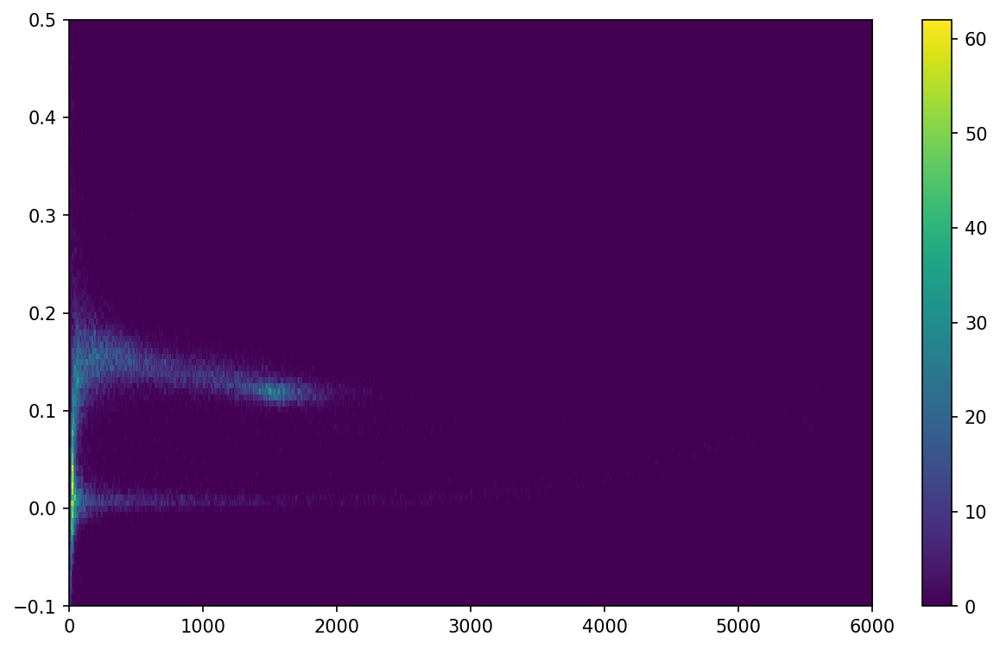

In [7]:

t.Draw("d.psd:d.l>>h2","","colz")
hist = r2m.Hist2D(h2)
fig,ax=plt.subplots(1,1,figsize=(20,20))
fig.set_dpi(150)
fig.set_size_inches(10,6)

hist.colz()

plt.show()


In [8]:
h2_py = h2.ProjectionY("h2_py",11,12)

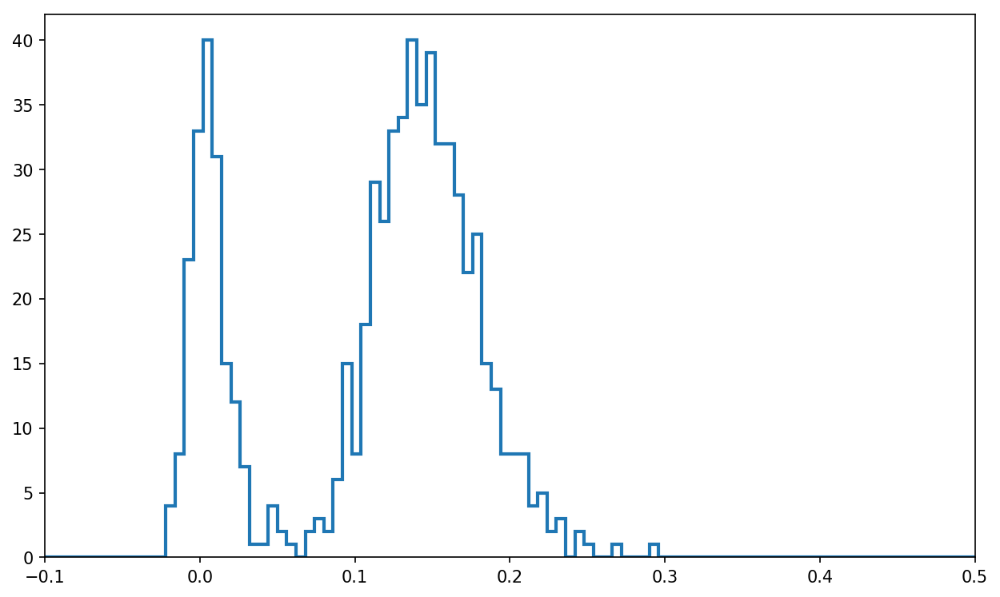

In [9]:
h2_py_hist = r2m.Hist(h2_py)
fig,ax=plt.subplots(1,1,figsize=(20,20))
fig.set_dpi(150)
fig.set_size_inches(10,6)
h2_py_hist.hist(histtype='step',linewidth=2)

plt.show()


In [10]:
Nbins = h2_py.GetNbinsX()
bin_contents=[]
bin_centers =[]
bin_error =[]
for i in range((Nbins)):
    bin_content = h2_py.GetBinContent(i)
    bin_contents.append(bin_content)
    bin_center = h2_py.GetBinCenter(i)
    bin_centers.append(bin_center)
    error =h2_py.GetBinError(i)
    bin_error.append(error)
    

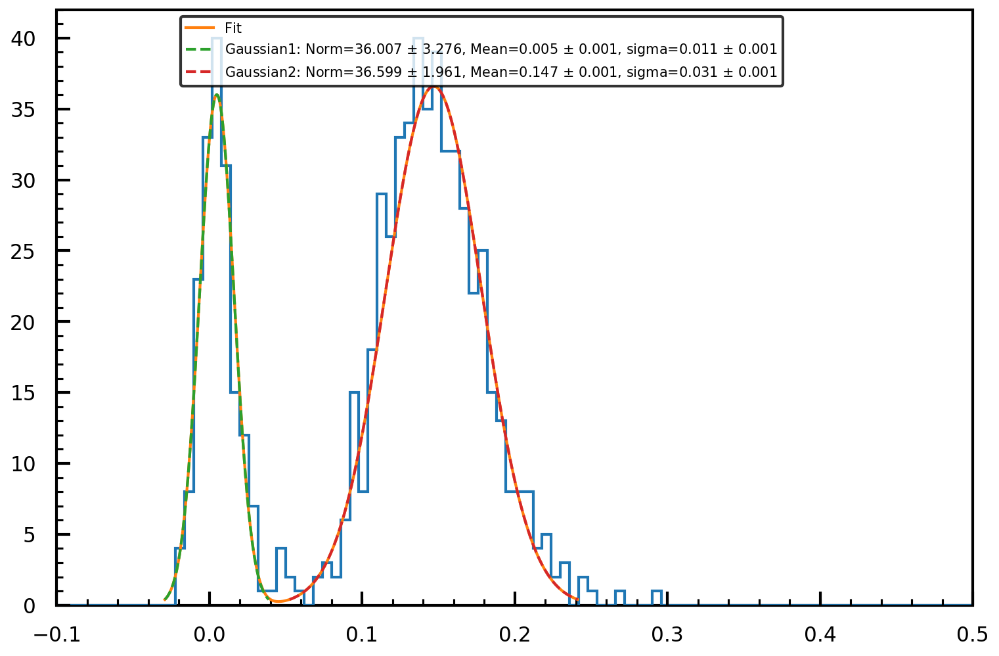

In [11]:
# Curve Fitting 
fig,ax=plt.subplots(1,1,figsize=(20,20))
fig.set_dpi(150)
fig.set_size_inches(12,8)
#Axis ticks 
ax.tick_params(which='major', direction='in', width=2, length=10, color='k', pad=15)
ax.tick_params(which='minor', direction='in', width=1.5, length=5, color='k', pad=15)
ax.xaxis.set_minor_locator(mtick.AutoMinorLocator(5))
ax.yaxis.set_minor_locator(mtick.AutoMinorLocator(5))
ax.tick_params(labelsize=15)
ax.patch.set_edgecolor('k')
ax.patch.set_linewidth('2')   

bin_centers=np.array(bin_centers)
bin_contents=np.array(bin_contents)
bin_error=np.array(bin_error)

mask1=bin_centers>-0.02
bin_centers_masked1=bin_centers[mask1]
bin_contents_masked1=bin_contents[mask1]
bin_error_masked1=bin_error[mask1]
mask2=bin_centers_masked1<0.25
bin_centers_masked=bin_centers_masked1[mask2]
bin_contents_masked=bin_contents_masked1[mask2]
bin_error_masked=bin_error_masked1[mask2]

mask3= bin_contents_masked>0
bin_contents_masked_pos = bin_contents_masked[mask3]
bin_centers_masked_pos = bin_centers_masked[mask3]
bin_error_masked_pos = bin_error_masked[mask3]

fsigma=3
binwidth=h2_py.GetBinWidth(1)
norm1_low = np.min(bin_contents_masked)
norm2_low = np.min(bin_contents_masked)
norm1_high = np.max(bin_contents_masked)
norm2_high = np.max(bin_contents_masked)
bounds=([norm1_low,-0.01,0.01,norm2_low,0.1,0.01],[norm1_high,0.01,0.1,norm2_high,0.2,0.5])
#popt, pcov = curve_fit(fitFunc,bin_centers,bin_contents,sigma=bin_error,bounds=bounds)    
popt, pcov = curve_fit(fitFunc,bin_centers_masked_pos,bin_contents_masked_pos,bounds=bounds,sigma=bin_error_masked_pos)    


x1 = np.linspace(popt[1] - fsigma*popt[2], popt[1] + fsigma*popt[2], 200)
x2 = np.linspace(popt[4] - fsigma*popt[5], popt[4] + fsigma*popt[5], 200)
x=np.linspace(popt[1] - fsigma*popt[2], popt[4] + fsigma*popt[5], 400)
y = fitFunc(x, *popt)
perr =  np.sqrt(np.diag(pcov))
y1 = gaussian1(x1,popt[0],popt[1],popt[2])
y2 = gaussian2(x2,popt[3],popt[4],popt[5])

h2_py_hist.hist(histtype='step',linewidth=2)
#h2_py_hist.errorbar(fmt='o',yerr=bin_error,color="red",ecolor='black',elinewidth=2,capsize=2,markeredgecolor='b')
plt.plot(x, y,label="Fit",linewidth=2)
plt.plot(x1,y1,label="Gaussian1: Norm=%5.3f $\\pm$ %5.3f, Mean=%5.3f $\\pm$ %5.3f, sigma=%5.3f $\\pm$ %5.3f"%(popt[0],perr[0],popt[1],perr[1],popt[2],perr[2]),linewidth=2,linestyle="--")
plt.plot(x2,y2,label="Gaussian2: Norm=%5.3f $\\pm$ %5.3f, Mean=%5.3f $\\pm$ %5.3f, sigma=%5.3f $\\pm$ %5.3f"%(popt[3],perr[3],popt[4],perr[4],popt[5],perr[5]),linewidth=2,linestyle="--")


#Legend Properties 
legend_properties = {'size':20}
leg =plt.legend(fontsize=10,bbox_to_anchor=(0.8,1),loc="upper right")
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth('2.0')

plt.savefig("psd_projection_y.png")
plt.show()

In [12]:
bin_contents_masked

array([ 4.,  8., 23., 33., 40., 31., 15., 12.,  7.,  1.,  1.,  4.,  2.,
        1.,  0.,  2.,  3.,  2.,  6., 15.,  8., 18., 29., 26., 33., 34.,
       40., 35., 39., 32., 32., 28., 22., 25., 15., 13.,  8.,  8.,  8.,
        4.,  5.,  2.,  3.,  0.,  2.])

In [13]:
100/(0.05)

2000.0

## Fitting all the bins 

In [14]:
bins = list(range(7,180))

In [15]:
L=[]
for i in range(len(bins)-1):
    bin_avg = (bins[i] + bins[i+1])/2.0
    L.append(bin_avg)

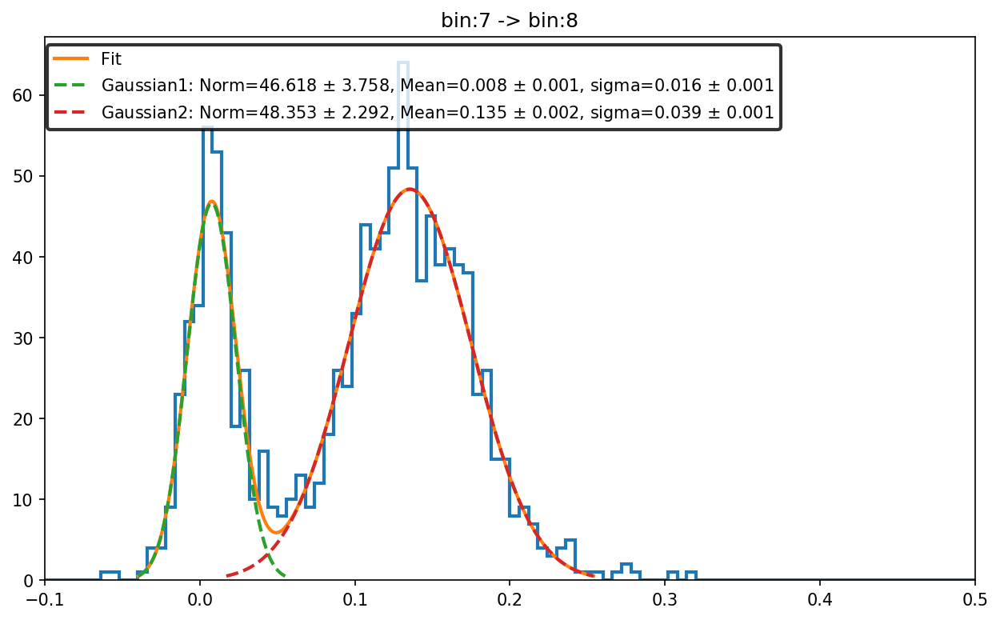

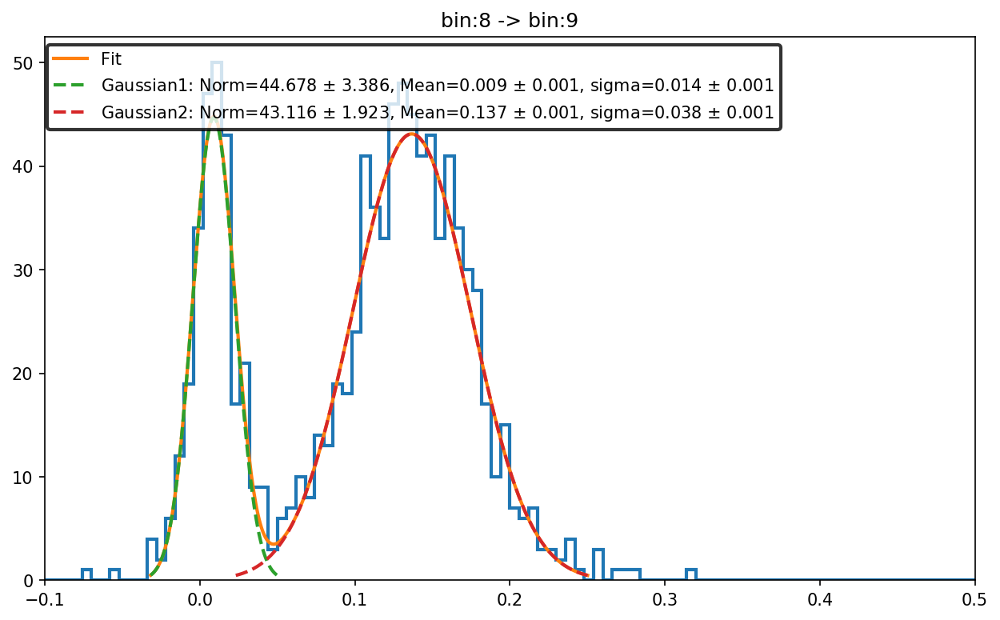

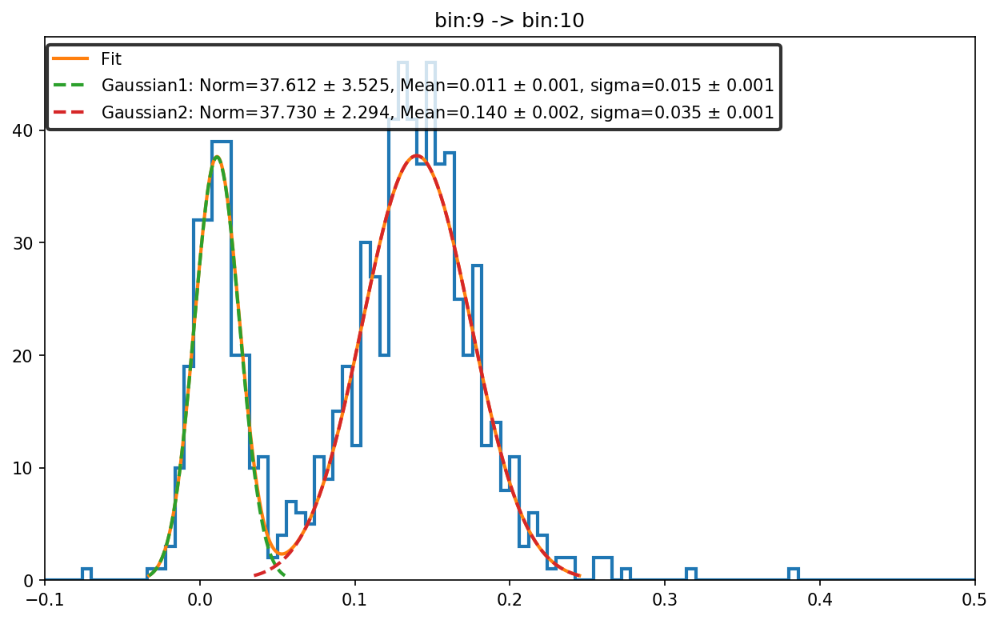

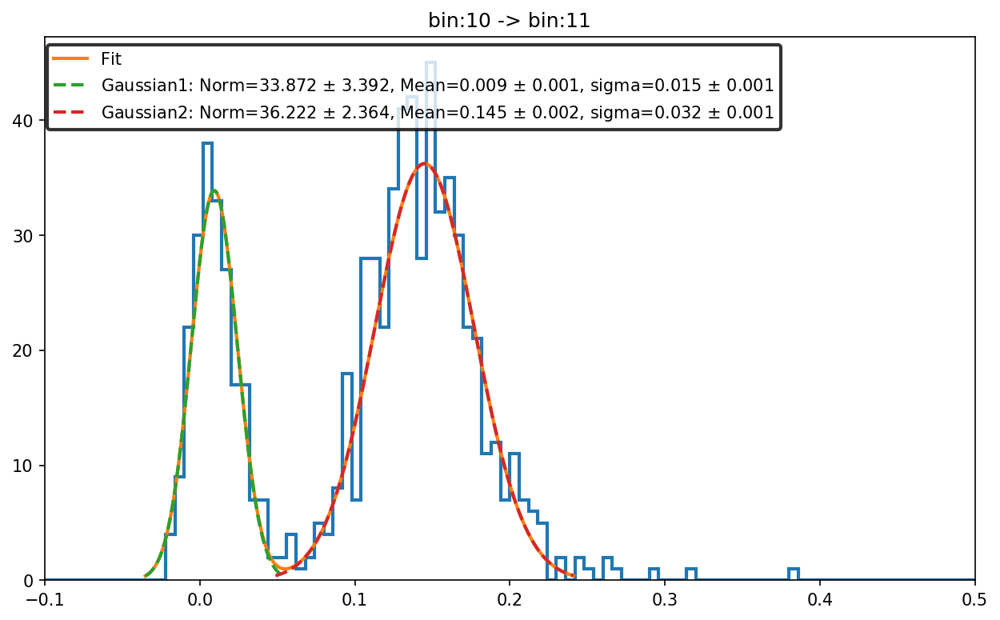

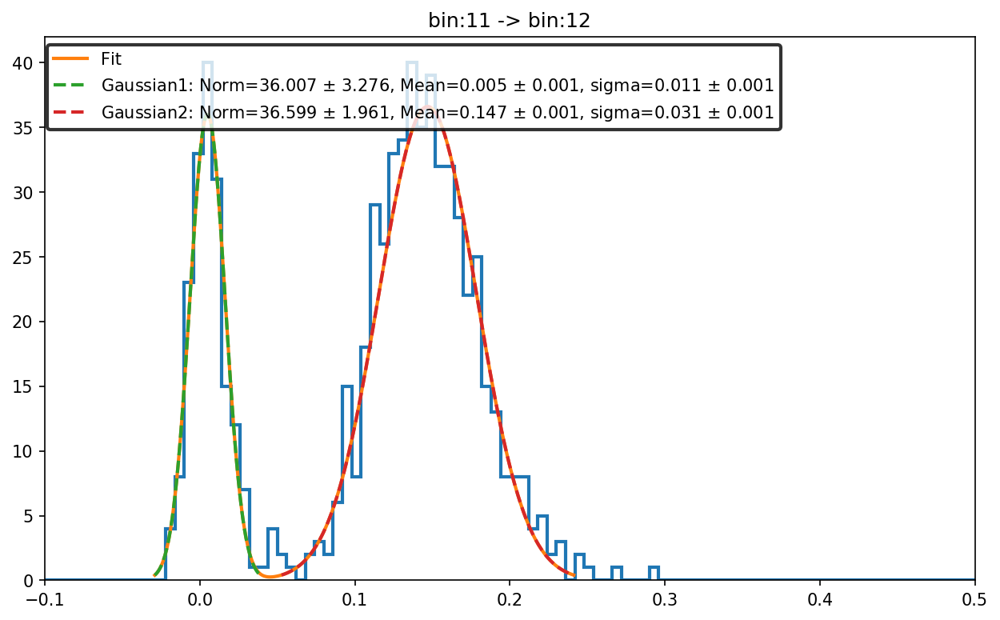

...

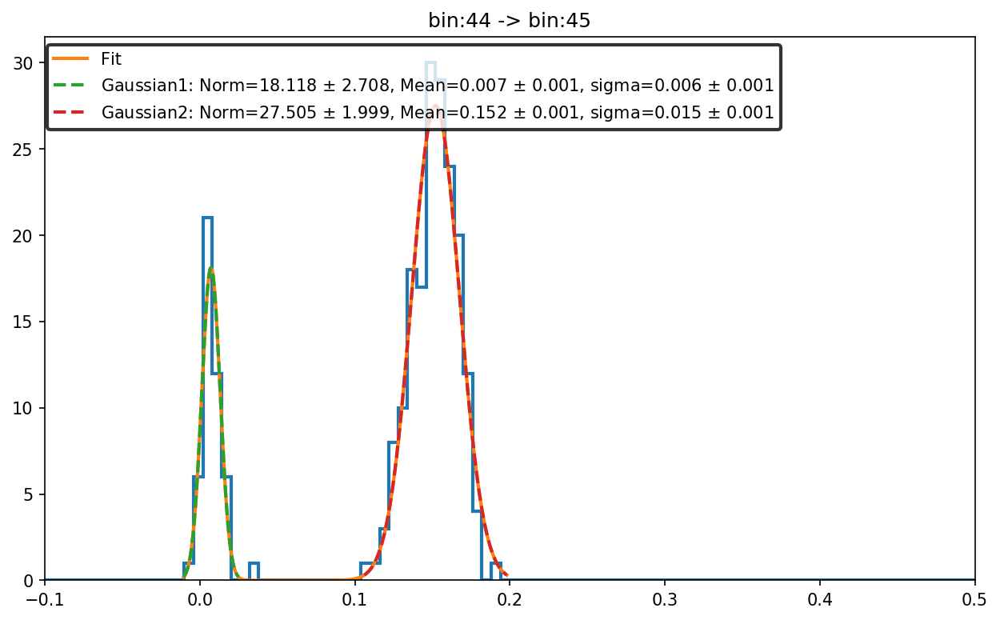

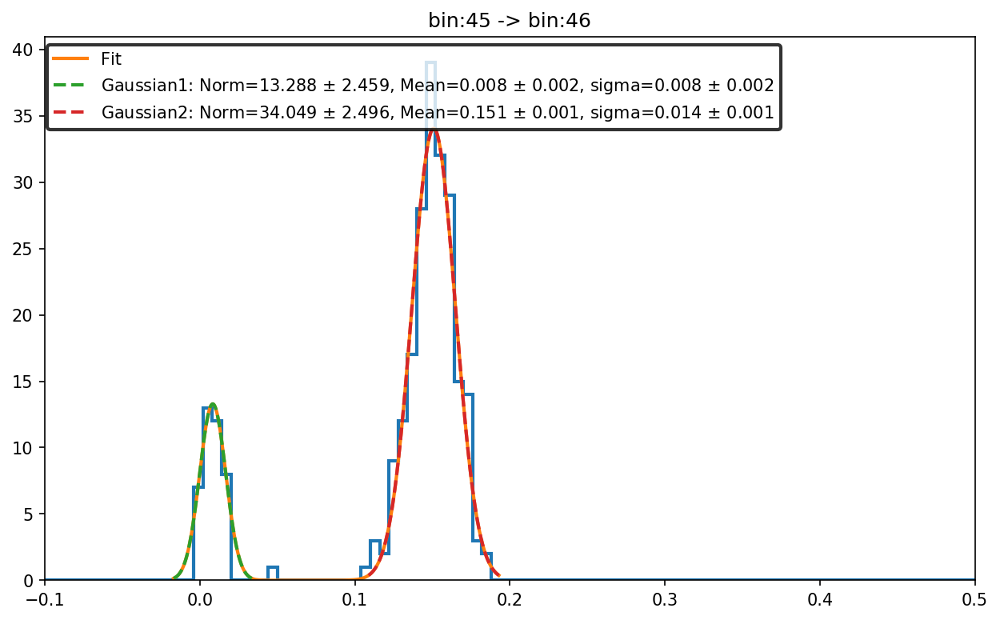

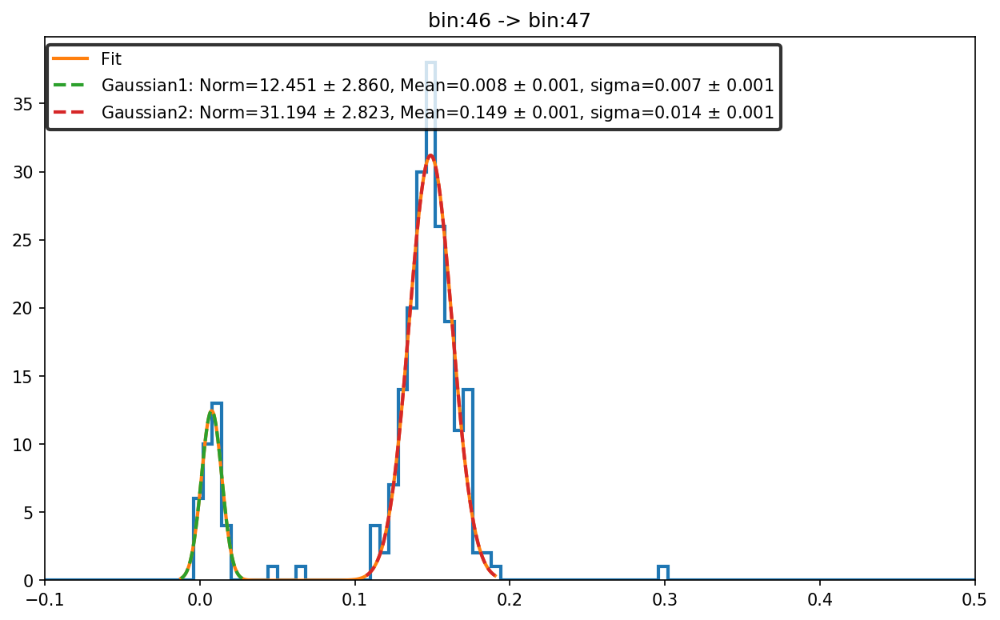

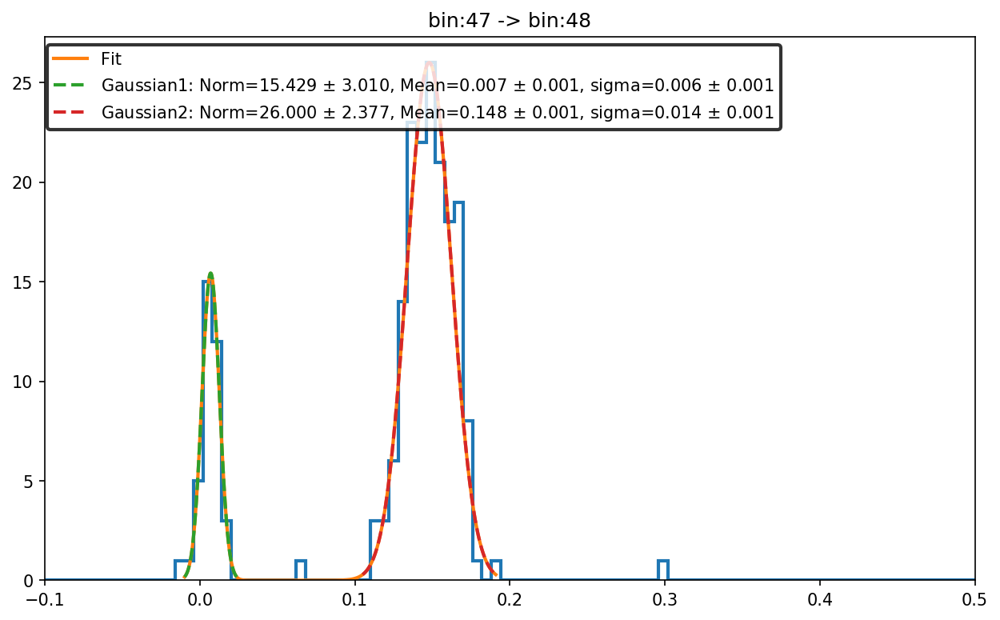

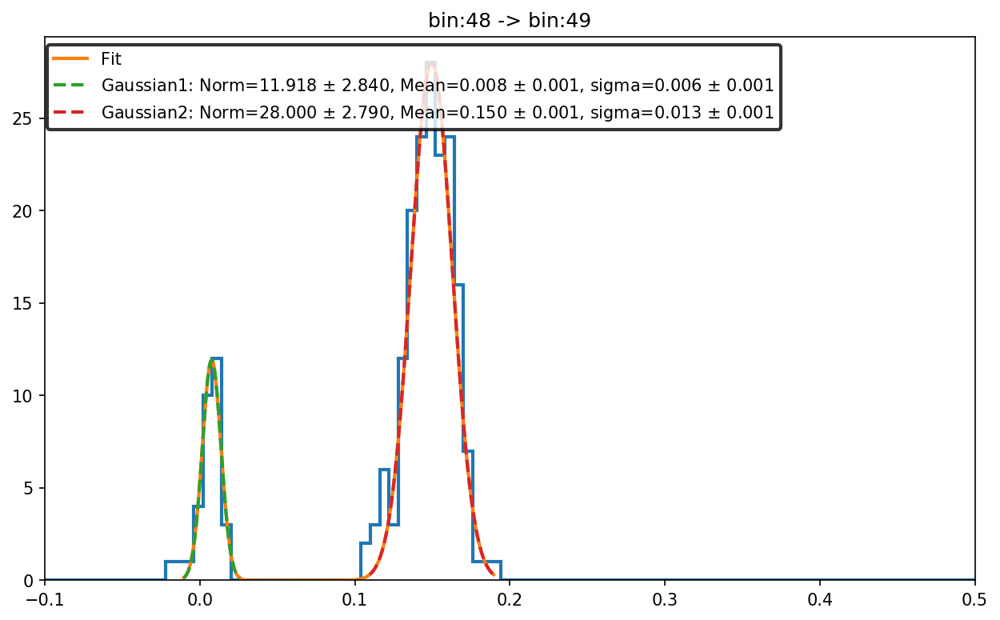

In [16]:
neutron_upper_band =[]
neutron_lower_band = []
gamma_upper_band =[]
gamma_lower_band =[]

bins = list(range(7,50))
L_low = []
for i in range(len(bins)-1):
    bin_avg = (bins[i] + bins[i+1])/2.0
    L_low.append(bin_avg)
    
    
for i in range(len(bins)-1):
    fig,ax=plt.subplots(1,1,figsize=(20,20))
    fig.set_dpi(150)
    fig.set_size_inches(10,6)

    
    h2_py = h2.ProjectionY("h2_py",bins[i],bins[i+1])
    h2_py_hist = r2m.Hist(h2_py)
    plt.title("bin:%d -> bin:%d" %(bins[i],bins[i+1]))
    #h2_py_hist.hist(histtype='step',linewidth=2)
    
    Nbins = h2_py.GetNbinsX()
    bin_contents=[]
    bin_centers =[]
    bin_error =[]
    for i in range((Nbins)):
        bin_content = h2_py.GetBinContent(i)
        bin_contents.append(bin_content)
        bin_center = h2_py.GetBinCenter(i)
        bin_centers.append(bin_center)
        error =h2_py.GetBinError(i)
        bin_error.append(error)
        
    bin_centers=np.array(bin_centers)
    bin_contents=np.array(bin_contents)
    bin_error=np.array(bin_error)

    mask1=bin_centers>-0.02
    bin_centers_masked1=bin_centers[mask1]
    bin_contents_masked1=bin_contents[mask1]
    bin_error_masked1=bin_error[mask1]
    mask2=bin_centers_masked1<0.25
    bin_centers_masked=bin_centers_masked1[mask2]
    bin_contents_masked=bin_contents_masked1[mask2]
    bin_error_masked=bin_error_masked1[mask2]
    mask3= bin_contents_masked>0
    bin_contents_masked_pos = bin_contents_masked[mask3]
    bin_centers_masked_pos = bin_centers_masked[mask3]
    bin_error_masked_pos = bin_error_masked[mask3]


    fsigma=3
    binwidth=h2_py.GetBinWidth(1)
    norm1_low = np.min(bin_contents_masked)
    norm2_low = np.min(bin_contents_masked)
    norm1_high = np.max(bin_contents_masked)
    norm2_high = np.max(bin_contents_masked)
    mean1_low = -0.005
    mean1_high = 0.05
    mean2_low = 0.1
    mean2_high = 0.2
    bounds=([norm1_low,-0.005,0.0002,norm2_low,0.1,0.01],[norm1_high,0.02,0.05,norm2_high,0.2,1])
    #popt, pcov = curve_fit(fitFunc,bin_centers,bin_contents,sigma=bin_error,bounds=bounds)    
    popt, pcov = curve_fit(fitFunc,bin_centers_masked_pos,bin_contents_masked_pos,bounds=bounds,sigma=bin_error_masked_pos)    


    x1 = np.linspace(popt[1] - fsigma*popt[2], popt[1] + fsigma*popt[2], 200)
    x2 = np.linspace(popt[4] - fsigma*popt[5], popt[4] + fsigma*popt[5], 200)
    x=np.linspace(popt[1] - fsigma*popt[2], popt[4] + fsigma*popt[5], 400)
    y = fitFunc(x, *popt)
    perr =  np.sqrt(np.diag(pcov))
    y1 = gaussian1(x1,popt[0],popt[1],popt[2])
    y2 = gaussian2(x2,popt[3],popt[4],popt[5])
    
    
    gamma_high = popt[1]+fsigma*popt[2]
    gamma_upper_band.append(gamma_high)
    
    gamma_low = popt[1]-fsigma*popt[2]
    gamma_lower_band.append(gamma_low)
    
    neutron_low = popt[4]-fsigma*popt[5]
    neutron_lower_band.append(neutron_low)
    
    neutron_high = popt[4]+fsigma*popt[5]
    neutron_upper_band.append(neutron_high)
    
    

    h2_py_hist.hist(histtype='step',linewidth=2)
    #h2_py_hist.errorbar(fmt='o',yerr=bin_error,color="red",ecolor='black',elinewidth=2,capsize=2,markeredgecolor='b')
    plt.plot(x, y,label="Fit",linewidth=2)
    plt.plot(x1,y1,label="Gaussian1: Norm=%5.3f $\\pm$ %5.3f, Mean=%5.3f $\\pm$ %5.3f, sigma=%5.3f $\\pm$ %5.3f"%(popt[0],perr[0],popt[1],perr[1],popt[2],perr[2]),linewidth=2,linestyle="--")
    plt.plot(x2,y2,label="Gaussian2: Norm=%5.3f $\\pm$ %5.3f, Mean=%5.3f $\\pm$ %5.3f, sigma=%5.3f $\\pm$ %5.3f"%(popt[3],perr[3],popt[4],perr[4],popt[5],perr[5]),linewidth=2,linestyle="--")
    

    #Legend Properties 
    legend_properties = {'size':20}
    leg =plt.legend(fontsize=10,bbox_to_anchor=(0.8,1),loc="upper right")
    leg.get_frame().set_edgecolor('k')
    leg.get_frame().set_linewidth('2.0')

    #plt.savefig("830_RS_fit_python.png")
    plt.show()
    
    
   
    

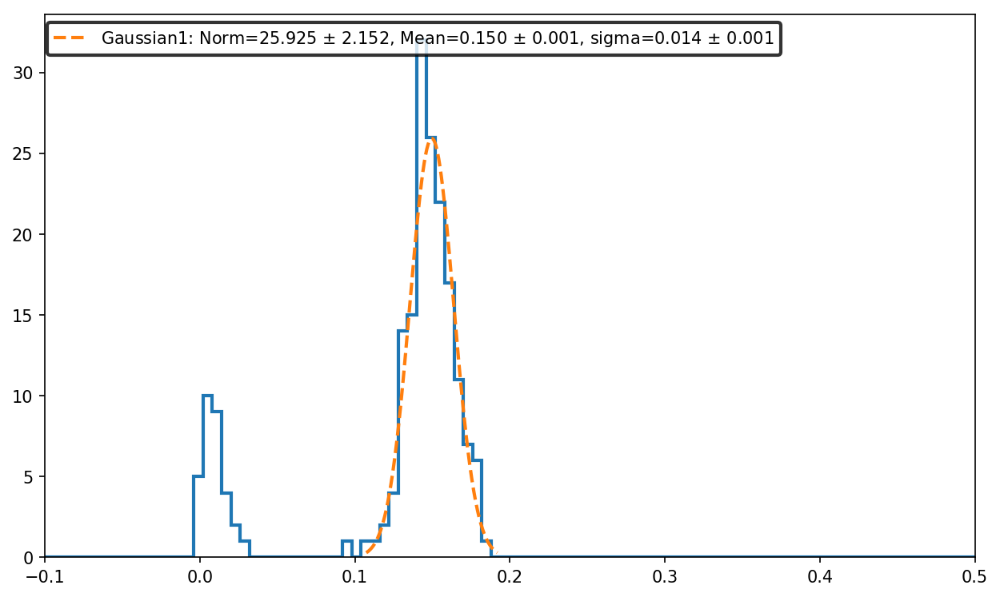

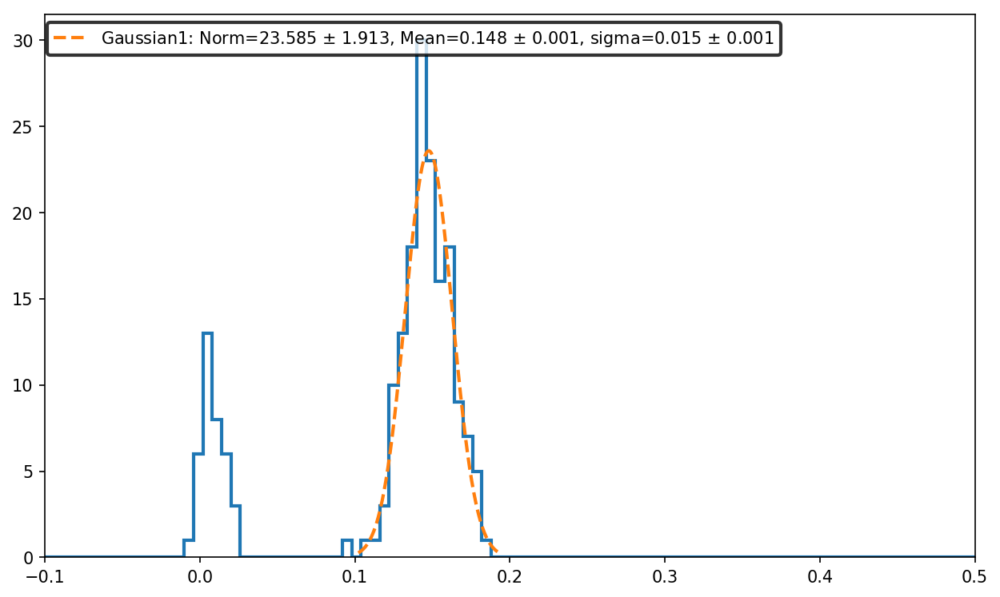

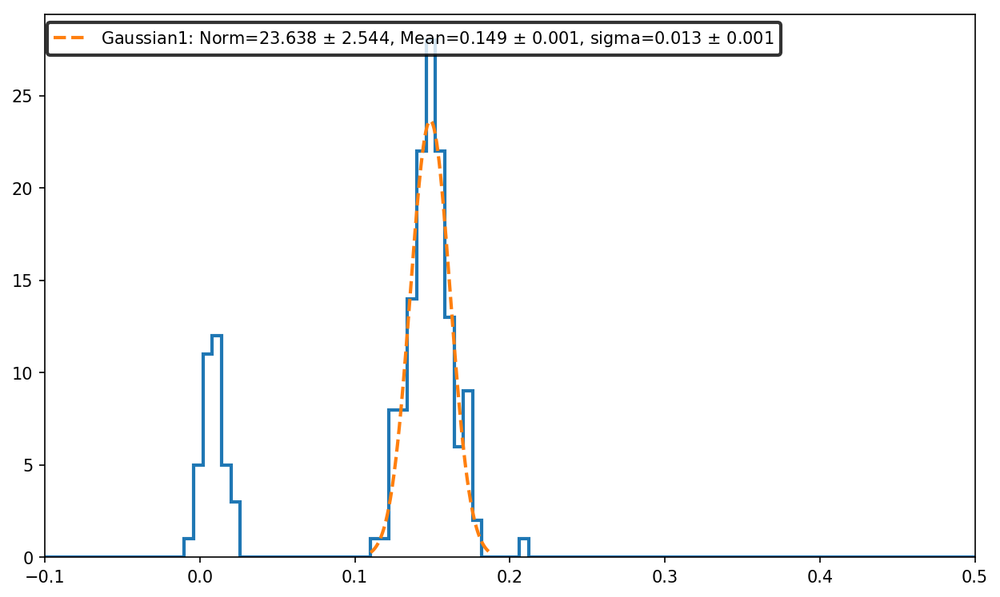

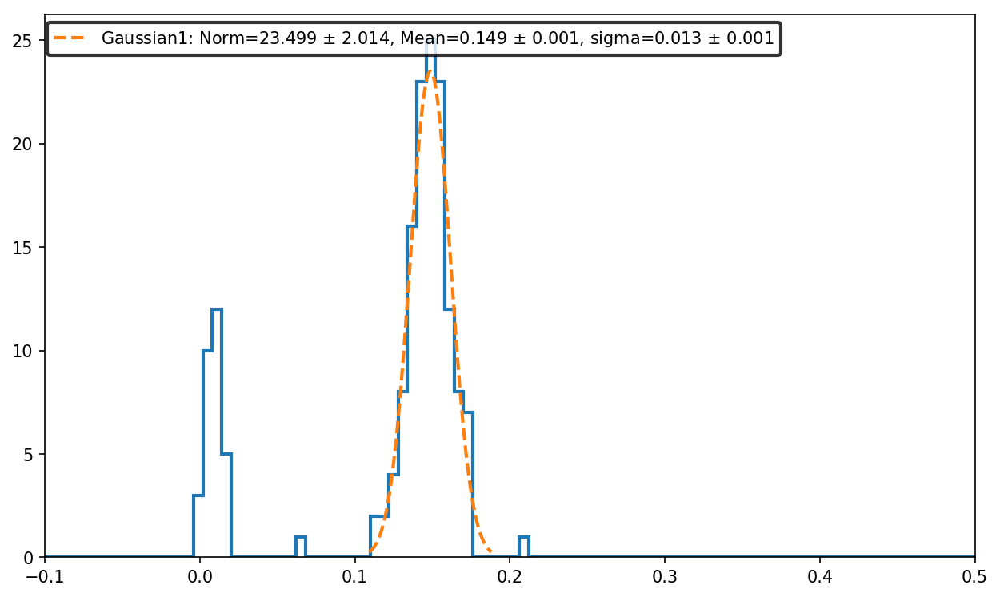

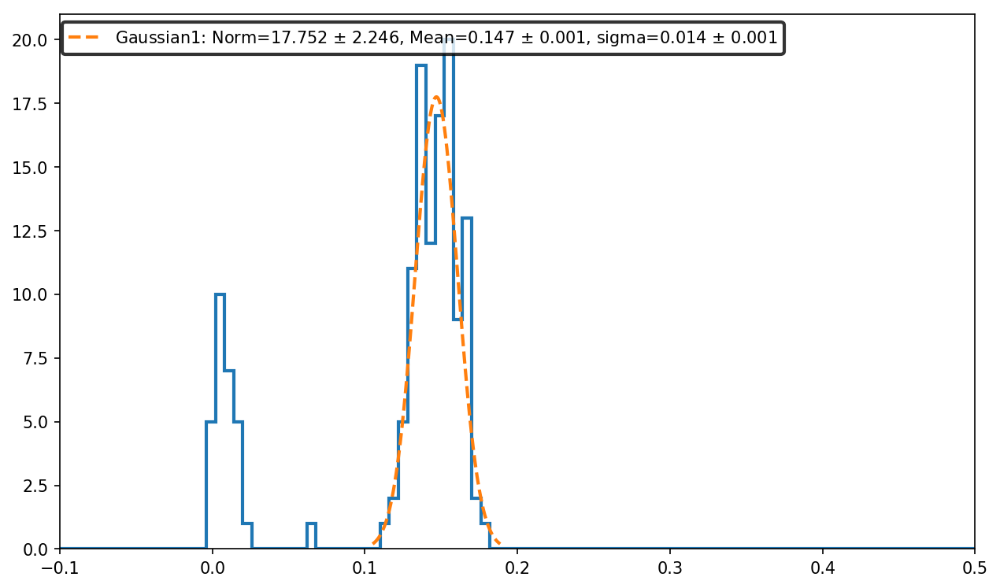

...

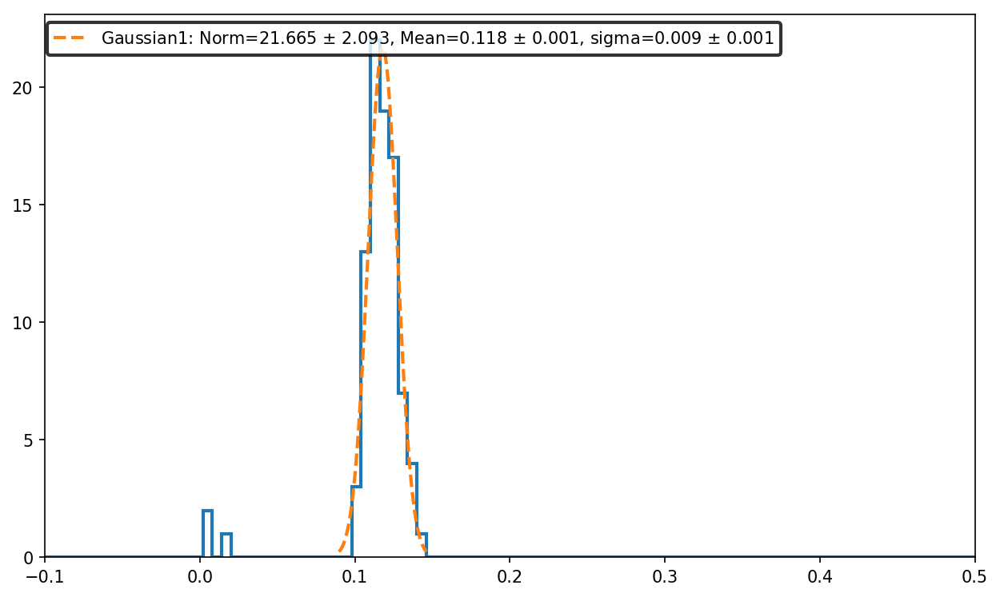

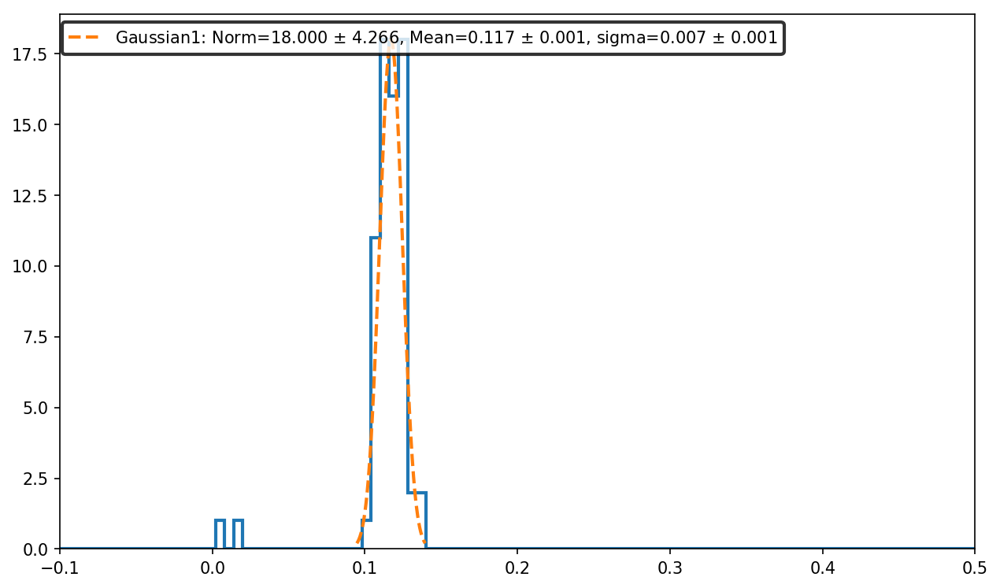

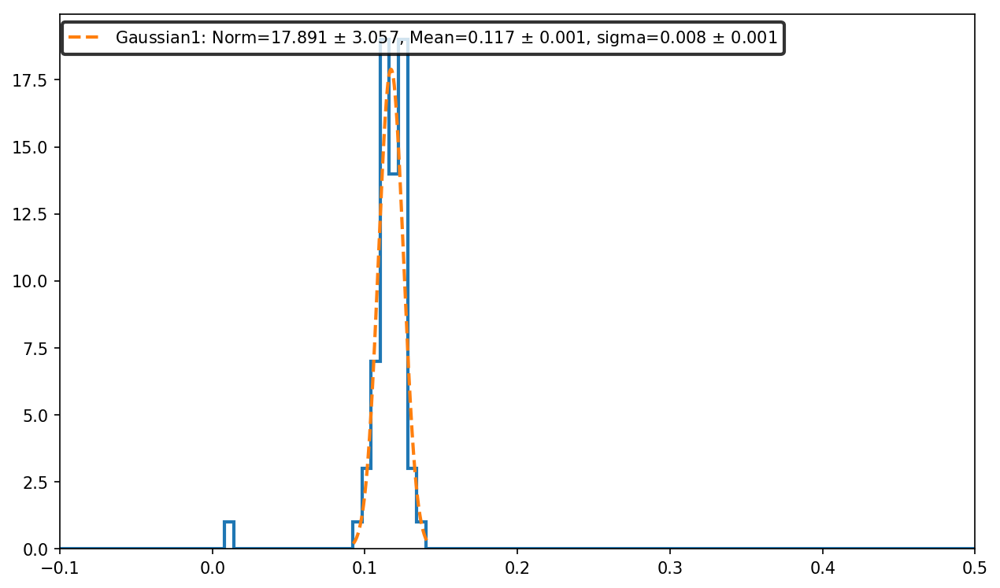

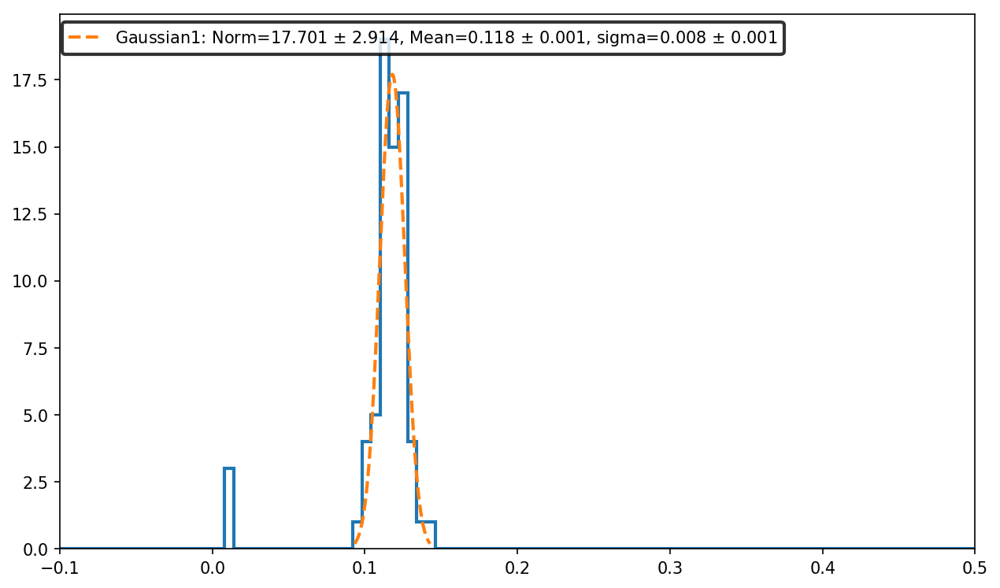

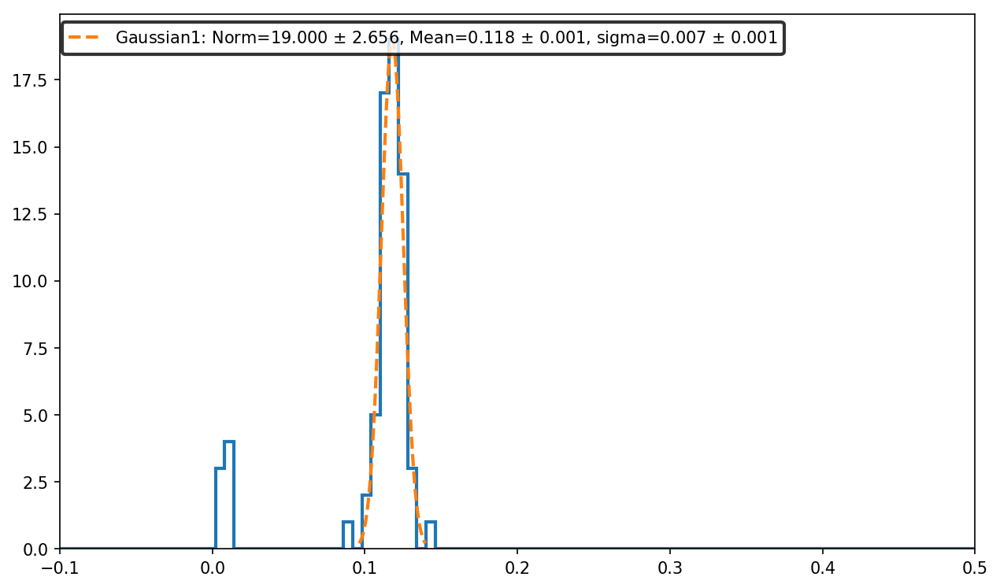

In [17]:
# Fitting just the neutron peak now 
neutron_lower_band_1=[]
neutron_upper_band_1=[]

bins = list(range(50,180))
L_high = []
for i in range(len(bins)-1):
    bin_avg = (bins[i] + bins[i+1])/2.0
    L_high.append(bin_avg)

    
    
for i in range(len(bins)-1):
    fig,ax=plt.subplots(1,1,figsize=(20,20))
    fig.set_dpi(150)
    fig.set_size_inches(10,6)

    
    h2_py = h2.ProjectionY("h2_py",bins[i],bins[i+1])
    h2_py_hist = r2m.Hist(h2_py)
    #h2_py_hist.hist(histtype='step',linewidth=2)
    
    Nbins = h2_py.GetNbinsX()
    bin_contents=[]
    bin_centers =[]
    bin_error =[]
    for i in range((Nbins)):
        bin_content = h2_py.GetBinContent(i)
        bin_contents.append(bin_content)
        bin_center = h2_py.GetBinCenter(i)
        bin_centers.append(bin_center)
        error =h2_py.GetBinError(i)
        bin_error.append(error)
        
    bin_centers=np.array(bin_centers)
    bin_contents=np.array(bin_contents)
    bin_error=np.array(bin_error)

    mask1=bin_centers>0.08
    bin_centers_masked1=bin_centers[mask1]
    bin_contents_masked1=bin_contents[mask1]
    bin_error_masked1=bin_error[mask1]
    mask2=bin_centers_masked1<0.25
    bin_centers_masked=bin_centers_masked1[mask2]
    bin_contents_masked=bin_contents_masked1[mask2]
    bin_error_masked=bin_error_masked1[mask2]
    mask3= bin_contents_masked>0
    bin_contents_masked_pos = bin_contents_masked[mask3]
    bin_centers_masked_pos = bin_centers_masked[mask3]
    bin_error_masked_pos = bin_error_masked[mask3]


    fsigma=3
    binwidth=h2_py.GetBinWidth(1)
    norm1_low = np.min(bin_contents_masked)
    norm2_low = np.min(bin_contents_masked)
    norm1_high = np.max(bin_contents_masked)
    norm2_high = np.max(bin_contents_masked)
    mean1_low = -0.005
    mean1_high = 0.05
    mean2_low = 0.1
    mean2_high = 0.2
    bounds=([norm2_low,0.1,0.005],[norm2_high,0.2,1])
    #popt, pcov = curve_fit(fitFunc,bin_centers,bin_contents,sigma=bin_error,bounds=bounds)    
    popt, pcov = curve_fit(gaussian2,bin_centers_masked_pos,bin_contents_masked_pos,bounds=bounds,sigma=bin_error_masked_pos)    


    x1 = np.linspace(popt[1] - fsigma*popt[2], popt[1] + fsigma*popt[2], 200)
    #x2 = np.linspace(popt[4] - fsigma*popt[5], popt[4] + fsigma*popt[5], 200)
    #x=np.linspace(popt[1] - fsigma*popt[2], popt[4] + fsigma*popt[5], 400)
    y = gaussian2(x1, *popt)
    perr =  np.sqrt(np.diag(pcov))
    y1 = gaussian2(x1,popt[0],popt[1],popt[2])
    #y2 = gaussian2(x2,popt[3],popt[4],popt[5])
    
    
    #gamma_high = popt[1]+fsigma*popt[2]
    #gamma_upper_band.append(gamma_high)
    
    #gamma_low = popt[1]-fsigma*popt[2]
    #gamma_lower_band.append(gamma_low)
    
    neutron_low = popt[1]-fsigma*popt[2]
    neutron_lower_band_1.append(neutron_low)
    
    neutron_high = popt[1]+fsigma*popt[2]
    neutron_upper_band_1.append(neutron_high)
    
    

    h2_py_hist.hist(histtype='step',linewidth=2)
    #h2_py_hist.errorbar(fmt='o',yerr=bin_error,color="red",ecolor='black',elinewidth=2,capsize=2,markeredgecolor='b')
    #plt.plot(x, y,label="Fit",linewidth=2)
    plt.plot(x1,y1,label="Gaussian1: Norm=%5.3f $\\pm$ %5.3f, Mean=%5.3f $\\pm$ %5.3f, sigma=%5.3f $\\pm$ %5.3f"%(popt[0],perr[0],popt[1],perr[1],popt[2],perr[2]),linewidth=2,linestyle="--")
    #plt.plot(x2,y2,label="Gaussian2: Norm=%5.3f $\\pm$ %5.3f, Mean=%5.3f $\\pm$ %5.3f, sigma=%5.3f $\\pm$ %5.3f"%(popt[3],perr[3],popt[4],perr[4],popt[5],perr[5]),linewidth=2,linestyle="--")
    #plt.title("bin:%d -> bin:%d" %(bins[i],bins[i+1]))

    #Legend Properties 
    legend_properties = {'size':20}
    leg =plt.legend(fontsize=10,bbox_to_anchor=(0.8,1),loc="upper right")
    leg.get_frame().set_edgecolor('k')
    leg.get_frame().set_linewidth('2.0')

    #plt.savefig("830_RS_fit_python.png")
    plt.show()
    
    
   
    

In [18]:
for i in range(len(L_low)):
    L_low[i] = L_low[i]*10

In [19]:
for i in range(len(L_high)):
    L_high[i] = L_high[i]*10

In [20]:
len(L)

172

In [21]:
len(neutron_upper_band)

42

In [22]:
L_neutron = (L_low +L_high)
neutron_lower_band_total = (neutron_lower_band+neutron_lower_band_1)
neutron_upper_band_total = (neutron_upper_band+neutron_upper_band_1)


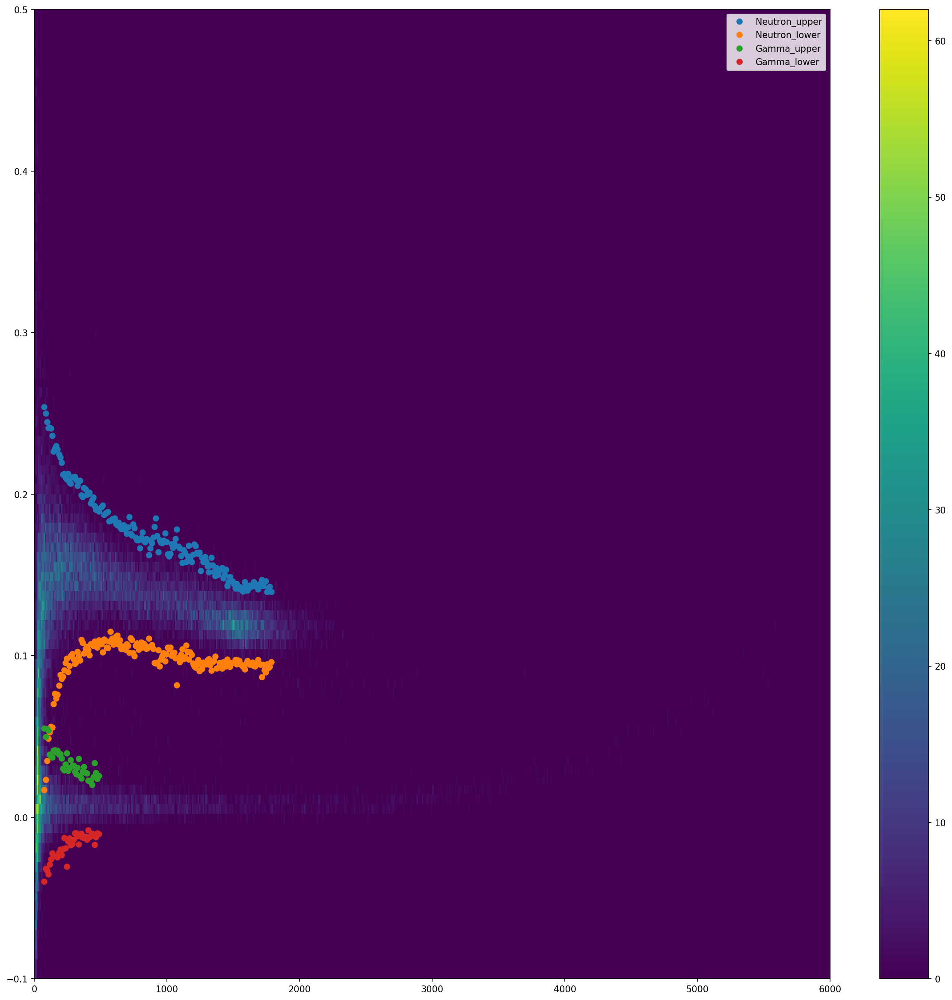

In [23]:
fig,ax=plt.subplots(1,1,figsize=(20,20))
fig.set_dpi(150)
t.Draw("d.psd:d.l>>h2","","colz")
hist = r2m.Hist2D(h2)
plt.plot(L_neutron,neutron_upper_band_total,'o',label="Neutron_upper")
plt.plot(L_neutron,neutron_lower_band_total,'o',label="Neutron_lower")
#plt.plot(L_high,neutron_lower_band_1,'o',label="Neutron_lower")
#plt.plot(L_high,neutron_upper_band_1,'o',label="Neutron_lower")

plt.plot(L_low,gamma_upper_band,'o',label="Gamma_upper")
plt.plot(L_low,gamma_lower_band,'o',label="Gamma_lower")
hist.colz()
plt.legend()
plt.show()

## Fitting the different neutron bands 

/home/shahina/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in divide
  # Remove the CWD from sys.path while we load stuff.


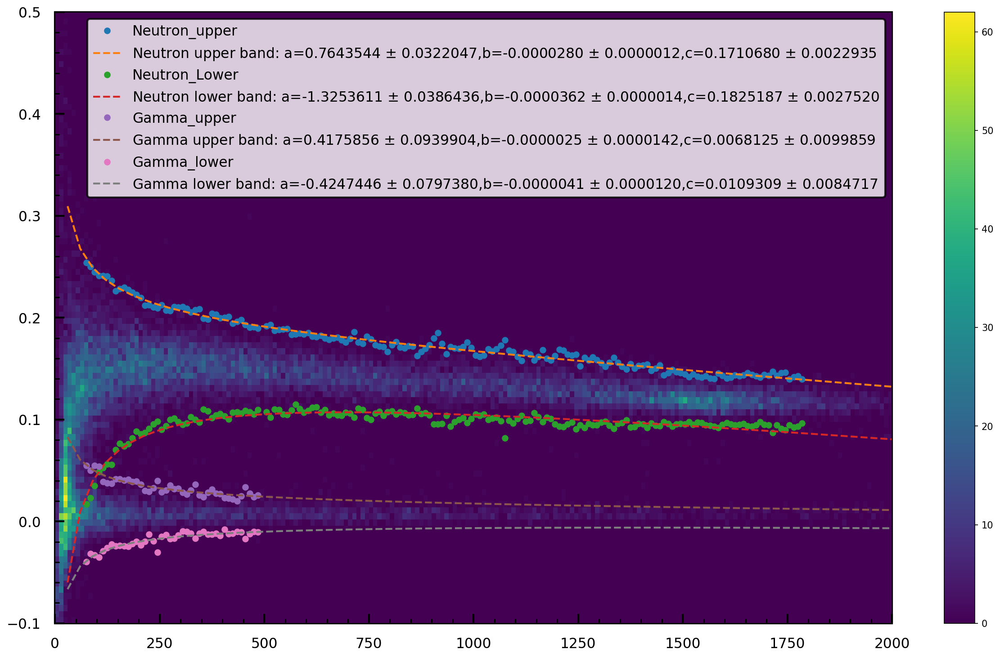

In [24]:
#fitting the upper neutron band 
popt_neutron_up, pcov_neutron_up = curve_fit(psd_fitting,L_neutron,neutron_upper_band_total)    
x_neutron_up = np.linspace(0,6000, 200)
y_neutron_up = psd_fitting(x_neutron_up, *popt_neutron_up)
perr_neutron_up =  np.sqrt(np.diag(pcov_neutron_up))

#fitting the lower neutron band 
popt_neutron_low, pcov_neutron_low = curve_fit(psd_fitting,L_neutron,neutron_lower_band_total)    
x_neutron_low = np.linspace(0,6000, 200)
y_neutron_low = psd_fitting(x_neutron_low, *popt_neutron_low)
perr_neutron_low =  np.sqrt(np.diag(pcov_neutron_low))

#fitting the upper gamma band 
popt_gamma_up, pcov_gamma_up = curve_fit(psd_fitting,L_low,gamma_upper_band)    
x_gamma_up = np.linspace(0,6000, 200)
y_gamma_up = psd_fitting(x_gamma_up, *popt_gamma_up)
perr_gamma_up =  np.sqrt(np.diag(pcov_gamma_up))

#fitting the lower gamma band 
popt_gamma_low, pcov_gamma_low = curve_fit(psd_fitting,L_low,gamma_lower_band)    
x_gamma_low = np.linspace(0,6000, 200)
y_gamma_low = psd_fitting(x_gamma_low, *popt_gamma_low)
perr_gamma_low =  np.sqrt(np.diag(pcov_gamma_low))

fig,ax=plt.subplots(1,1,figsize=(20,20))
fig.set_dpi(150)
fig.set_size_inches(20,12)
#Axis ticks 
ax.tick_params(which='major', direction='in', width=2, length=10, color='k', pad=15)
ax.tick_params(which='minor', direction='in', width=1.5, length=5, color='k', pad=15)
ax.xaxis.set_minor_locator(mtick.AutoMinorLocator(5))
ax.yaxis.set_minor_locator(mtick.AutoMinorLocator(5))
ax.tick_params(labelsize=15)
ax.patch.set_edgecolor('k')
ax.patch.set_linewidth('2')   

hist = r2m.Hist2D(h2)
plt.plot(L_neutron,neutron_upper_band_total,'o',label="Neutron_upper")
plt.plot(x_neutron_up,y_neutron_up,label="Neutron upper band: a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_neutron_up[0],perr_neutron_up[0],popt_neutron_up[1],perr_neutron_up[1],popt_neutron_up[2],perr_neutron_up[2]),linewidth=2,linestyle="--")
plt.plot(L_neutron,neutron_lower_band_total,'o',label="Neutron_Lower")
plt.plot(x_neutron_low,y_neutron_low,label="Neutron lower band: a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_neutron_low[0],perr_neutron_low[0],popt_neutron_low[1],perr_neutron_low[1],popt_neutron_low[2],perr_neutron_low[2]),linewidth=2,linestyle="--")
plt.plot(L_low,gamma_upper_band,'o',label="Gamma_upper")
plt.plot(x_gamma_up,y_gamma_up,label="Gamma upper band: a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_gamma_up[0],perr_gamma_up[0],popt_gamma_up[1],perr_gamma_up[1],popt_gamma_up[2],perr_gamma_up[2]),linewidth=2,linestyle="--")
plt.plot(L_low,gamma_lower_band,'o',label="Gamma_lower")
plt.plot(x_gamma_low,y_gamma_low,label="Gamma lower band: a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_gamma_low[0],perr_gamma_low[0],popt_gamma_low[1],perr_gamma_low[1],popt_gamma_low[2],perr_gamma_low[2]),linewidth=2,linestyle="--")
hist.colz()
#Legend Properties 
legend_properties = {'size':20}
leg =plt.legend(fontsize=15,loc="upper right")
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth('2.0')
plt.xlim(0,2000)
plt.savefig("psd_fit.png")
plt.show()
    
    

/home/shahina/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in divide
  # Remove the CWD from sys.path while we load stuff.


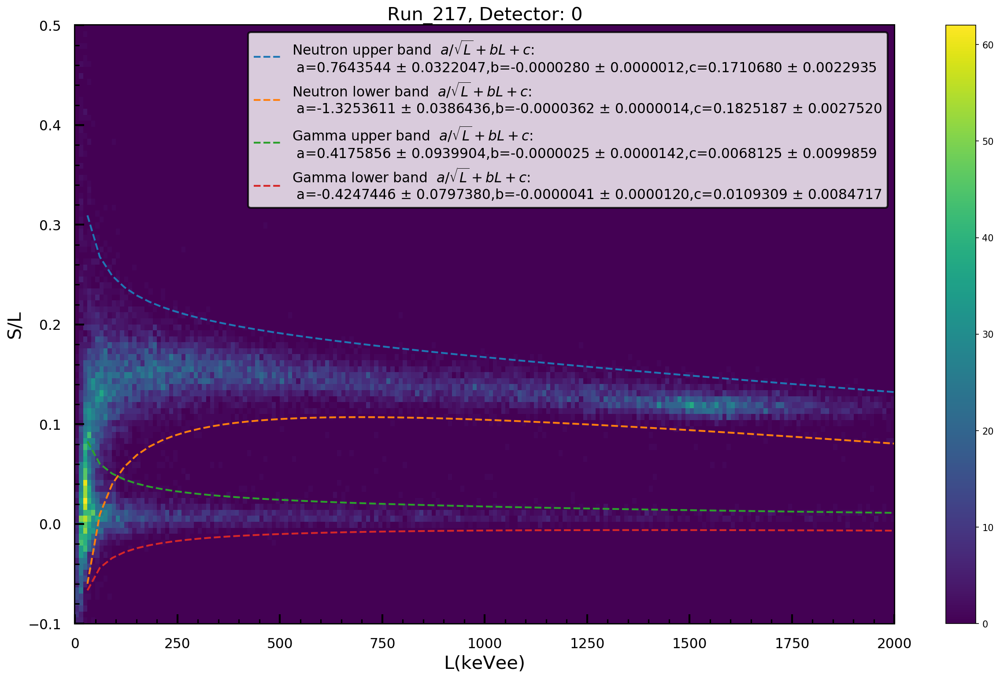

In [25]:
#fitting the upper neutron band 
popt_neutron_up, pcov_neutron_up = curve_fit(psd_fitting,L_neutron,neutron_upper_band_total)    
x_neutron_up = np.linspace(0,6000, 200)
y_neutron_up = psd_fitting(x_neutron_up, *popt_neutron_up)
perr_neutron_up =  np.sqrt(np.diag(pcov_neutron_up))

#fitting the lower neutron band 
popt_neutron_low, pcov_neutron_low = curve_fit(psd_fitting,L_neutron,neutron_lower_band_total)    
x_neutron_low = np.linspace(0,6000, 200)
y_neutron_low = psd_fitting(x_neutron_low, *popt_neutron_low)
perr_neutron_low =  np.sqrt(np.diag(pcov_neutron_low))

#fitting the upper gamma band 
popt_gamma_up, pcov_gamma_up = curve_fit(psd_fitting,L_low,gamma_upper_band)    
x_gamma_up = np.linspace(0,6000, 200)
y_gamma_up = psd_fitting(x_gamma_up, *popt_gamma_up)
perr_gamma_up =  np.sqrt(np.diag(pcov_gamma_up))

#fitting the lower gamma band 
popt_gamma_low, pcov_gamma_low = curve_fit(psd_fitting,L_low,gamma_lower_band)    
x_gamma_low = np.linspace(0,6000, 200)
y_gamma_low = psd_fitting(x_gamma_low, *popt_gamma_low)
perr_gamma_low =  np.sqrt(np.diag(pcov_gamma_low))

fig,ax=plt.subplots(1,1,figsize=(20,20))
fig.set_dpi(150)
fig.set_size_inches(20,12)
#Axis ticks 
ax.tick_params(which='major', direction='in', width=2, length=10, color='k', pad=15)
ax.tick_params(which='minor', direction='in', width=1.5, length=5, color='k', pad=15)
ax.xaxis.set_minor_locator(mtick.AutoMinorLocator(5))
ax.yaxis.set_minor_locator(mtick.AutoMinorLocator(5))
ax.tick_params(labelsize=15)
ax.patch.set_edgecolor('k')
ax.patch.set_linewidth('2')   

hist = r2m.Hist2D(h2)
#plt.plot(L_neutron,neutron_upper_band_total,'o',label="Neutron_upper")
plt.plot(x_neutron_up,y_neutron_up,label="Neutron upper band  $a/\sqrt{L} + bL +c$: \n a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_neutron_up[0],perr_neutron_up[0],popt_neutron_up[1],perr_neutron_up[1],popt_neutron_up[2],perr_neutron_up[2]),linewidth=2,linestyle="--")
#plt.plot(L_neutron,neutron_lower_band_total,'o',label="Neutron_Lower")
plt.plot(x_neutron_low,y_neutron_low,label="Neutron lower band  $a/\sqrt{L} + bL +c$: \n a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_neutron_low[0],perr_neutron_low[0],popt_neutron_low[1],perr_neutron_low[1],popt_neutron_low[2],perr_neutron_low[2]),linewidth=2,linestyle="--")
#plt.plot(L_low,gamma_upper_band,'o',label="Gamma_upper")
plt.plot(x_gamma_up,y_gamma_up,label="Gamma upper band  $a/\sqrt{L} + bL +c$: \n a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_gamma_up[0],perr_gamma_up[0],popt_gamma_up[1],perr_gamma_up[1],popt_gamma_up[2],perr_gamma_up[2]),linewidth=2,linestyle="--")
#plt.plot(L_low,gamma_lower_band,'o',label="Gamma_lower")
plt.plot(x_gamma_low,y_gamma_low,label="Gamma lower band  $a/\sqrt{L} + bL +c$: \n a=%5.7f $\\pm$ %5.7f,b=%5.7f $\\pm$ %5.7f,c=%5.7f $\\pm$ %5.7f"%(popt_gamma_low[0],perr_gamma_low[0],popt_gamma_low[1],perr_gamma_low[1],popt_gamma_low[2],perr_gamma_low[2]),linewidth=2,linestyle="--")
hist.colz()
#Legend Properties 
legend_properties = {'size':20}
leg =plt.legend(fontsize=15,loc="upper right")
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth('2.0')
plt.xlim(0,2000)
plt.ylabel("S/L",fontsize=20)
plt.xlabel("L(keVee)",fontsize=20)
plt.title("Run_217, Detector: 0",fontsize=20)
plt.savefig("psd_fit_1_det0.png")
plt.show()
    
    

In [26]:
x_neutron_up

array([   0.        ,   30.15075377,   60.30150754,   90.45226131,
        120.60301508,  150.75376884,  180.90452261,  211.05527638,
        241.20603015,  271.35678392,  301.50753769,  331.65829146,
        361.80904523,  391.95979899,  422.11055276,  452.26130653,
        482.4120603 ,  512.56281407,  542.71356784,  572.86432161,
        603.01507538,  633.16582915,  663.31658291,  693.46733668,
        723.61809045,  753.76884422,  783.91959799,  814.07035176,
        844.22110553,  874.3718593 ,  904.52261307,  934.67336683,
        964.8241206 ,  994.97487437, 1025.12562814, 1055.27638191,
       1085.42713568, 1115.57788945, 1145.72864322, 1175.87939698,
       1206.03015075, 1236.18090452, 1266.33165829, 1296.48241206,
       1326.63316583, 1356.7839196 , 1386.93467337, 1417.08542714,
       1447.2361809 , 1477.38693467, 1507.53768844, 1537.68844221,
       1567.83919598, 1597.98994975, 1628.14070352, 1658.29145729,
       1688.44221106, 1718.59296482, 1748.74371859, 1778.89447

In [27]:
y_neutron_up

array([       inf, 0.30942645, 0.2678115 , 0.24890551, 0.23729458,
       0.22910299, 0.22283533, 0.21777614, 0.21353446, 0.20987617,
       0.20665143, 0.20375926, 0.20112882, 0.19870874, 0.19646074,
       0.19435562, 0.19237071, 0.19048804, 0.18869321, 0.1869745 ,
       0.18532227, 0.18372851, 0.1821865 , 0.18069054, 0.17923579,
       0.17781809, 0.17643383, 0.1750799 , 0.17375355, 0.1724524 ,
       0.17117432, 0.16991743, 0.16868007, 0.16746074, 0.16625812,
       0.16507099, 0.16389828, 0.162739  , 0.16159226, 0.16045726,
       0.15933326, 0.15821958, 0.1571156 , 0.15602076, 0.15493453,
       0.15385644, 0.15278603, 0.1517229 , 0.15066667, 0.14961697,
       0.1485735 , 0.14753593, 0.14650398, 0.14547739, 0.1444559 ,
       0.14343929, 0.14242733, 0.14141983, 0.14041658, 0.1394174 ,
       0.13842213, 0.13743061, 0.13644268, 0.1354582 , 0.13447703,
       0.13349905, 0.13252414, 0.13155217, 0.13058305, 0.12961667,
       0.12865292, 0.12769173, 0.12673299, 0.12577662, 0.12482